In [1]:
%matplotlib inline

import os
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib import rcParams
sns.set(rc={"font.size":9,"axes.titlesize":15,"axes.labelsize":9,
            "axes.titlepad":11, "axes.labelpad":9, "legend.fontsize":7,
            "legend.title_fontsize":7, 'axes.grid' : False})
import cv2
import json
import pandas as pd
import glob
import os.path as osp
#from path import Path
import datetime
import numpy as np
from tqdm.auto import tqdm
import random
import shutil
from sklearn.model_selection import train_test_split
from ensemble_boxes import *
import warnings
from collections import Counter

In [2]:
train_annotations = pd.read_csv("train.csv")
print(train_annotations.shape)
train_annotations.head(5)

(67914, 8)


,image_id,class_name,class_id,rad_id,x_min,y_min,x_max,y_max
0,50a418190bc3fb1ef1633bf9678929b3,No finding,14,R11,NaN,NaN,NaN,NaN
1,21a10246a5ec7af151081d0cd6d65dc9,No finding,14,R7,NaN,NaN,NaN,NaN
2,9a5094b2563a1ef3ff50dc5c7ff71345,Cardiomegaly,3,R10,691.0,1375.0,1653.0,1831.0
3,051132a778e61a86eb147c7c6f564dfe,Aortic enlargement,0,R10,1264.0,743.0,1611.0,1019.0
4,063319de25ce7edb9b1c6b8881290140,No finding,14,R10,NaN,NaN,NaN,NaN


In [3]:

train_annotations_nofinding = train_annotations[train_annotations['class_name'] == 'No finding']
train_annotations =  train_annotations[(train_annotations['class_name'] != 'No finding')
                    & (train_annotations['class_name'] != 'Mediastinal shift') 
                    & (train_annotations['class_name'] != 'Enlarged PA') 
                    & (train_annotations['class_name'] != 'Rib fracture')
                    & (train_annotations['class_name'] != 'Lung cavity')
                    & (train_annotations['class_name'] != 'Emphysema')
                    & (train_annotations['class_name'] != 'Clavicle fracture')
                    & (train_annotations['class_name'] != 'Lung cyst')]
print(train_annotations.shape)
print(train_annotations_nofinding.shape)
train_annotations.head(6)

(36096, 8)
(31818, 8)


,image_id,class_name,class_id,rad_id,x_min,y_min,x_max,y_max
2,9a5094b2563a1ef3ff50dc5c7ff71345,Cardiomegaly,3,R10,691.0,1375.0,1653.0,1831.0
3,051132a778e61a86eb147c7c6f564dfe,Aortic enlargement,0,R10,1264.0,743.0,1611.0,1019.0
5,1c32170b4af4ce1a3030eb8167753b06,Pleural thickening,11,R9,627.0,357.0,947.0,433.0
6,0c7a38f293d5f5e4846aa4ca6db4daf1,ILD,5,R17,1347.0,245.0,2188.0,2169.0
7,47ed17dcb2cbeec15182ed335a8b5a9e,Nodule/Mass,8,R9,557.0,2352.0,675.0,2484.0
8,d3637a1935a905b3c326af31389cb846,Aortic enlargement,0,R10,1329.0,743.0,1521.0,958.0


In [4]:
unique_image_ids = train_annotations['image_id'].unique()
unique_image_ids.shape

(4394,)

In [5]:
frequency = train_annotations['class_name'].value_counts()
print(frequency)


class_name
Aortic enlargement    7162
Cardiomegaly          5427
Pleural thickening    4842
Pulmonary fibrosis    4655
Nodule/Mass           2580
Lung Opacity          2483
Pleural effusion      2476
Other lesion          2203
Infiltration          1247
ILD                   1000
Calcification          960
Consolidation          556
Atelectasis            279
Pneumothorax           226
Name: count, dtype: int64


In [6]:
def plot_img(img, size=(18, 18), is_rgb=True, title="", cmap='gray'):
    plt.figure(figsize=size)
    plt.imshow(img, cmap=cmap)
    plt.suptitle(title)
    plt.show()

def plot_imgs(imgs, cols=2, size=10, is_rgb=True, title="", cmap='gray', img_size=None):
    rows = len(imgs)//cols + 1
    fig = plt.figure(figsize=(cols*size, rows*size))
    for i, img in enumerate(imgs):
        if img_size is not None:
            img = cv2.resize(img, img_size)
        fig.add_subplot(rows, cols, i+1)
        plt.imshow(img, cmap=cmap)
    plt.suptitle(title)
    
def draw_bbox(image, box, label, color):   
    alpha = 0.1
    alpha_box = 0.4
    overlay_bbox = image.copy()
    overlay_text = image.copy()
    output = image.copy()
    font_scale = 3  # Increase font size
    text_thickness = 4  ## Text thickness

    text_width, text_height = cv2.getTextSize(label.upper(), cv2.FONT_HERSHEY_SIMPLEX, font_scale, text_thickness)[0]
    cv2.rectangle(overlay_bbox, (box[0], box[1]), (box[2], box[3]),
                color, -1)
    cv2.addWeighted(overlay_bbox, alpha, output, 1 - alpha, 0, output)
    cv2.rectangle(overlay_text, (box[0], box[1]-7-text_height), (box[0]+text_width+2, box[1]),
                (0, 0, 0), -1)
    cv2.addWeighted(overlay_text, alpha_box, output, 1 - alpha_box, 0, output)
    cv2.rectangle(output, (box[0], box[1]), (box[2], box[3]),
                    color, 15)
    cv2.putText(output, label.upper(), (box[0], box[1]-5),
            cv2.FONT_HERSHEY_SIMPLEX, font_scale, (255, 255, 255), text_thickness, cv2.LINE_AA)
    return output

def draw_bbox_224(image, box, label, color):   
    alpha = 0.1
    alpha_box = 0.4
    thickness = 2
    overlay_bbox = image.copy()
    overlay_text = image.copy()
    output = image.copy()

    text_width, text_height = cv2.getTextSize(label.upper(), cv2.FONT_HERSHEY_SIMPLEX, 0.3, 1)[0]
    cv2.rectangle(overlay_bbox, (box[0], box[1]), (box[2], box[3]),
                color, -1)
    cv2.addWeighted(overlay_bbox, alpha, output, 1 - alpha, 0, output)
    cv2.rectangle(overlay_text, (box[0], box[1]-7-text_height), (box[0]+text_width+2, box[1]),
                (0, 0, 0), -1)
    cv2.addWeighted(overlay_text, alpha_box, output, 1 - alpha_box, 0, output)
    cv2.rectangle(output, (box[0], box[1]), (box[2], box[3]),
                    color, thickness)
    cv2.putText(output, label.upper(), (box[0], box[1]-5),
            cv2.FONT_HERSHEY_SIMPLEX, 0.3, (255, 255, 255), 1, cv2.LINE_AA)
    return output

label2color = [[59, 238, 119], [222, 21, 229], [94, 49, 164], [206, 221, 133], [117, 75, 3],
                 [210, 224, 119], [211, 176, 166], [63, 7, 197], [102, 65, 77], [194, 134, 175],
                 [209, 219, 50], [255, 44, 47], [89, 125, 149], [110, 27, 100]]

In [7]:
train_annotations['class_name'] = train_annotations['class_name'].str.replace(' ', '_')
train_annotations['class_name'] = train_annotations['class_name'].str.replace('/', '_')
frequency = train_annotations['class_name'].value_counts()
print(frequency)

class_name
Aortic_enlargement    7162
Cardiomegaly          5427
Pleural_thickening    4842
Pulmonary_fibrosis    4655
Nodule_Mass           2580
Lung_Opacity          2483
Pleural_effusion      2476
Other_lesion          2203
Infiltration          1247
ILD                   1000
Calcification          960
Consolidation          556
Atelectasis            279
Pneumothorax           226
Name: count, dtype: int64


In [8]:
train_annotations['image_id'][:6]

2    9a5094b2563a1ef3ff50dc5c7ff71345
3    051132a778e61a86eb147c7c6f564dfe
5    1c32170b4af4ce1a3030eb8167753b06
6    0c7a38f293d5f5e4846aa4ca6db4daf1
7    47ed17dcb2cbeec15182ed335a8b5a9e
8    d3637a1935a905b3c326af31389cb846
Name: image_id, dtype: object

In [9]:
labels =  [
            "__ignore__",
            "Aortic_enlargement",
            "Atelectasis",
            "Calcification",
            "Cardiomegaly",
            "Consolidation",
            "ILD",
            "Infiltration",
            "Lung_Opacity",
            "Nodule/Mass",
            "Other_lesion",
            "Pleural_effusion",
            "Pleural_thickening",
            "Pneumothorax",
            "Pulmonary_fibrosis"
            ]
viz_labels = labels[1:]
viz_labels


['Aortic_enlargement',
 'Atelectasis',
 'Calcification',
 'Cardiomegaly',
 'Consolidation',
 'ILD',
 'Infiltration',
 'Lung_Opacity',
 'Nodule/Mass',
 'Other_lesion',
 'Pleural_effusion',
 'Pleural_thickening',
 'Pneumothorax',
 'Pulmonary_fibrosis']

In [10]:
train_hw = pd.read_csv("train_meta.csv")
#train_hw['dim0'] = train_hw['dim0'].astype(int)
#train_hw['dim1'] = train_hw['dim1'].astype(int)
train_hw = train_hw[train_hw['image_id'].isin(unique_image_ids)]
print(train_hw.shape)
train_hw.head(6)

(4394, 3)


,image_id,dim0,dim1
2,0005e8e3701dfb1dd93d53e2ff537b6e,3072,3072
4,0007d316f756b3fa0baea2ff514ce945,2880,2304
6,000d68e42b71d3eac10ccc077aba07c1,2880,2304
7,00150343289f317a0ad5629d5b7d9ef9,2508,2525
9,001d127bad87592efe45a5c7678f8b8d,3072,3072
14,0046f681f078851293c4e710c4466058,2880,2304


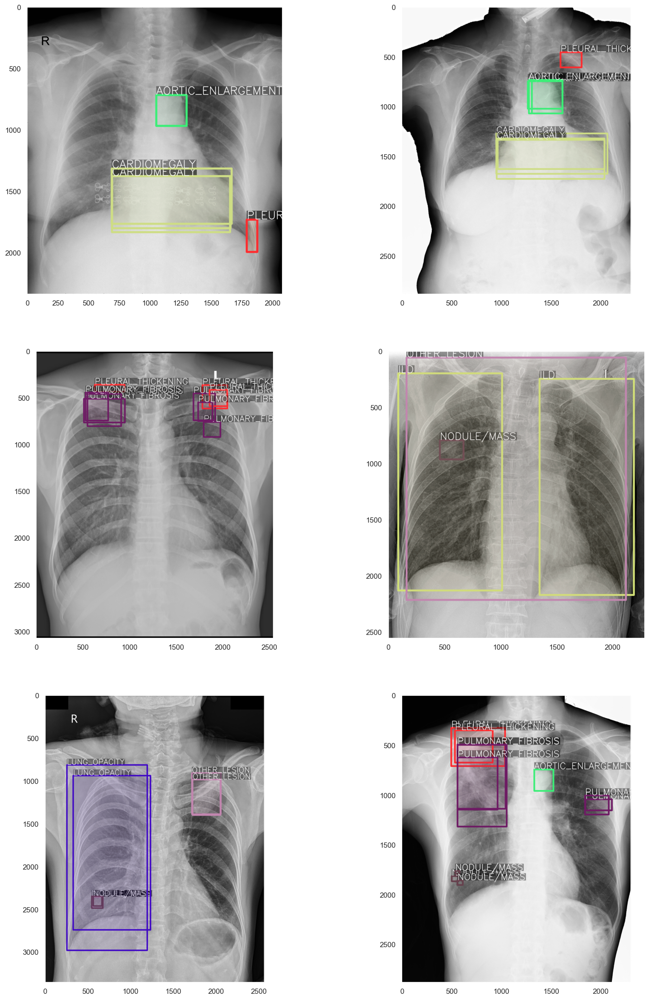

In [28]:
# map label_id to specify color

thickness = 3
imgs = []

for img_id, path in zip(train_annotations[:6]['image_id'], train_annotations[:6]['image_id']):
    path = path + '.jpeg'
    #print(img_id)
    #print(path)

    boxes = train_annotations.loc[train_annotations['image_id'] == img_id,
                                  ['x_min', 'y_min', 'x_max', 'y_max']].values
    img_labels = train_annotations.loc[train_annotations['image_id'] == img_id, ['class_id']].values.squeeze()
    #print(img_labels)
    #print(type(img_labels))
    #print(boxes)
    #print(type(boxes))
    img = cv2.imread(path)
    #print(type(img))
    if np.ndim(img_labels) == 0:
    # Convert img_labels to a 1-d array
        img_labels = np.array([img_labels])
    
    for label_id, box in zip(img_labels, boxes):
        #print(label_id)
        color = label2color[label_id]
        #print(viz_labels[label_id])
        
        img = draw_bbox(img, list(np.int_(box)), viz_labels[label_id], color)
    imgs.append(img)

plot_imgs(imgs, size=9, cmap=None)
plt.show()

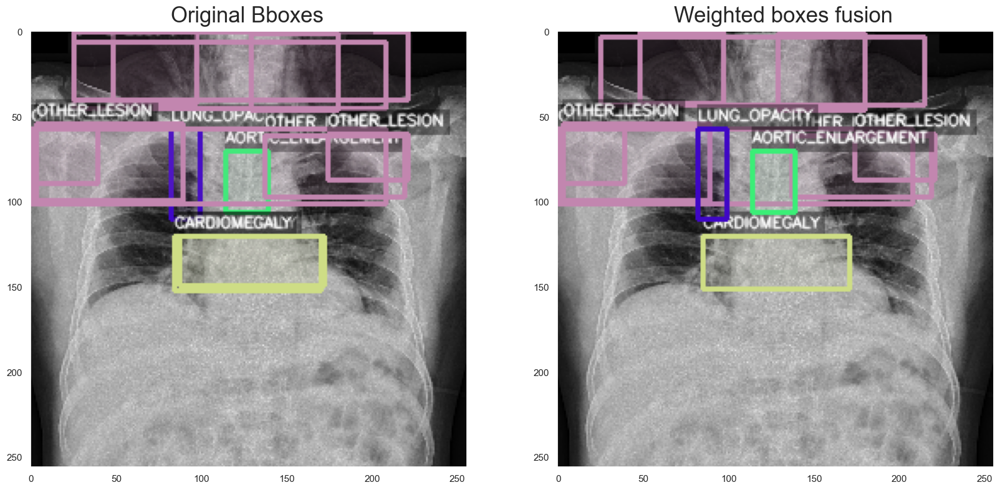

In [19]:
iou_thr = 0.5
skip_box_thr = 0.0001
viz_images = []
sigma = 0.1
selected_image_ids = [unique_image_ids[i] for i in [0]]

def adjust_boxes(boxes, x_scale, y_scale):
    #Adjust bounding box size
    adjusted_boxes = []
    for box in boxes:
        adjusted_boxes.append([int(box[0] * x_scale), int(box[1] * y_scale), 
                               int(box[2] * x_scale), int(box[3] * y_scale)])
    return adjusted_boxes

id = 'fd810298e165ef0b9a88bb25fda7a34b'

path = id + '.jpeg'
img_array_orig = cv2.imread(path)
img_annotations = train_annotations[train_annotations.image_id==id]

boxes_viz = img_annotations[['x_min', 'y_min', 'x_max', 'y_max']].to_numpy().tolist()
labels_viz = img_annotations['class_id'].to_numpy().tolist()

#Resize original image
img_array = cv2.resize(img_array_orig, (256, 256))
x_scale = 224 / img_array_orig.shape[1]
y_scale = 224 / img_array_orig.shape[0]

    # Update bounding box coordinates
adjusted_boxes_viz = adjust_boxes(boxes_viz, x_scale, y_scale)

    # Draw the original bounding box
img_before = img_array.copy()
for box, label in zip(adjusted_boxes_viz, labels_viz):
    color = label2color[int(label)]
    img_before = draw_bbox_224(img_before, box, viz_labels[label], color)
viz_images.append(img_before)

boxes_list = []
scores_list = []
labels_list = []
weights = []

boxes_single = []
labels_single = []

cls_ids = img_annotations['class_id'].unique().tolist()
count_dict = Counter(img_annotations['class_id'].tolist())

for cid in cls_ids:       
    ## Performing Fusing operation only for multiple bboxes with the same label
    if count_dict[cid]==1:
        labels_single.append(cid)
        boxes_single.append(img_annotations[img_annotations.class_id==cid][['x_min', 'y_min', 'x_max', 'y_max']].to_numpy().squeeze().tolist())

    else:
        cls_list =img_annotations[img_annotations.class_id==cid]['class_id'].tolist()
        labels_list.append(cls_list)
        bbox = img_annotations[img_annotations.class_id==cid][['x_min', 'y_min', 'x_max', 'y_max']].to_numpy()
        ## Normalizing Bbox by Image Width and Height
        bbox = bbox/(img_array_orig.shape[1], img_array_orig.shape[0], img_array_orig.shape[1], img_array_orig.shape[0])
        bbox = np.clip(bbox, 0, 1)
        boxes_list.append(bbox.tolist())
        scores_list.append(np.ones(len(cls_list)).tolist())

        weights.append(1)

# Execute WBF
boxes, scores, box_labels = weighted_boxes_fusion(boxes_list, scores_list, labels_list, weights=weights, iou_thr=iou_thr, skip_box_thr=skip_box_thr)
boxes = boxes * (img_array_orig.shape[1], img_array_orig.shape[0], img_array_orig.shape[1], img_array_orig.shape[0])
boxes = boxes.round(1).tolist()
box_labels = box_labels.astype(int).tolist()
boxes.extend(boxes_single)
box_labels.extend(labels_single)


# Draw the bounding box after WBF
img_after = img_array.copy()
boxes = adjust_boxes(boxes, x_scale, y_scale)
for box, label in zip(boxes, box_labels):
    color = label2color[int(label)]
    img_after = draw_bbox_224(img_after, list(np.int_(box)), viz_labels[label], color)
viz_images.append(img_after)

for i, (box, label) in enumerate(zip(boxes, box_labels)):
    img_box = img_array.copy()
    color = (0, 255, 0)
    img_box = draw_bbox_224(img_box, list(np.int_(box)), viz_labels[label], color)
    file_name = f'wbf_box_{i}.png'
    cv2.imwrite(file_name, img_box)  # save image


        
plot_imgs(viz_images, cmap=None)
plt.figtext(0.3, 0.9,"Original Bboxes", va="top", ha="center", size=25)
plt.figtext(0.73, 0.9,"Weighted boxes fusion", va="top", ha="center", size=25)
plt.savefig('wbf.png', bbox_inches='tight')
plt.show()


0it [00:00, ?it/s]

Counter({3: 3, 10: 1, 11: 1, 0: 1})

Counter({0: 3, 3: 3, 11: 1})

Counter({13: 6, 11: 3})



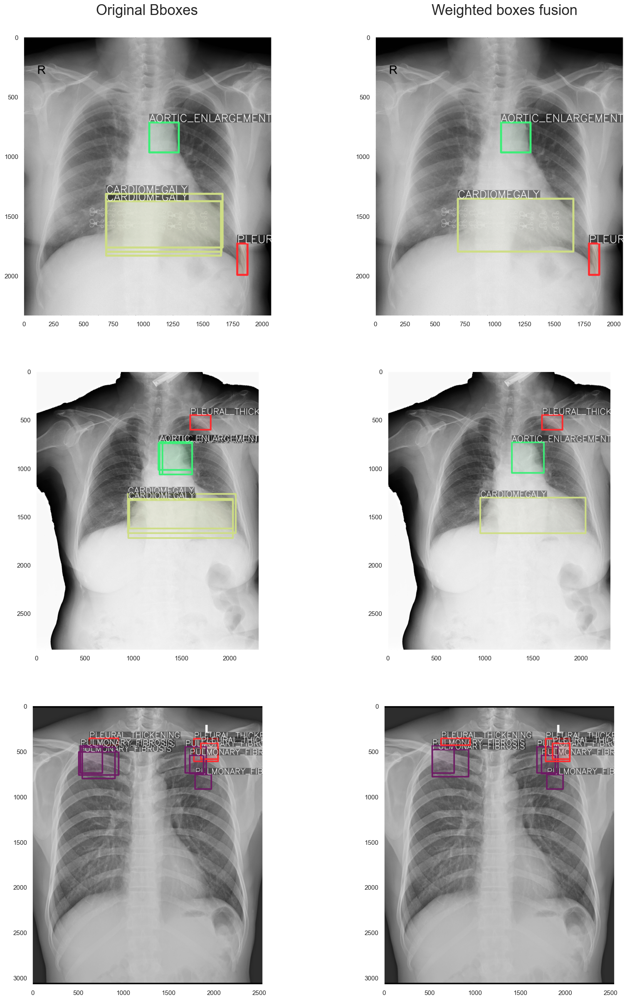

In [11]:

def draw_bbox_(image, box, label, color):   
    alpha = 0.1
    alpha_box = 0.4
    overlay_bbox = image.copy()
    overlay_text = image.copy()
    output = image.copy()
    font_scale = 3  # Increase font size
    text_thickness = 4  # Text thickness

    text_width, text_height = cv2.getTextSize(label.upper(), cv2.FONT_HERSHEY_SIMPLEX, font_scale, text_thickness)[0]
    cv2.rectangle(overlay_bbox, (box[0], box[1]), (box[2], box[3]),
                color, -1)
    cv2.addWeighted(overlay_bbox, alpha, output, 1 - alpha, 0, output)
    cv2.rectangle(overlay_text, (box[0], box[1]-7-text_height), (box[0]+text_width+2, box[1]),
                (0, 0, 0), -1)
    cv2.addWeighted(overlay_text, alpha_box, output, 1 - alpha_box, 0, output)
    cv2.rectangle(output, (box[0], box[1]), (box[2], box[3]),
                    color, 15)
    cv2.putText(output, label.upper(), (box[0], box[1]-5),
            cv2.FONT_HERSHEY_SIMPLEX, font_scale, (255, 255, 255), text_thickness, cv2.LINE_AA)
    return output


iou_thr = 0.5
skip_box_thr = 0.0001
viz_images = []
sigma = 0.1
selected_image_ids = [unique_image_ids[i] for i in [0, 1, 2]]
for i, id in tqdm(enumerate(selected_image_ids)):
    #print(id)
    path = id + '.jpeg'
    #print(path)
    img_array  = cv2.imread(path)
    #image_basename = Path(path).stem
    #print(f"(\'{image_basename}\', \'{path}\')")
    img_annotations = train_annotations[train_annotations.image_id==id]

    boxes_viz = img_annotations[['x_min', 'y_min', 'x_max', 'y_max']].to_numpy().tolist()
    labels_viz = img_annotations['class_id'].to_numpy().tolist()
    
    #print("Bboxes before WBF:\n", boxes_viz)
    #print("Labels before WBF:\n", labels_viz)
    
    ## Visualize Original Bboxes
    img_before = img_array
    #print('a')
    #print(type(img_array))
    #print(type(img_before))
    for box, label in zip(boxes_viz, labels_viz):
        x_min, y_min, x_max, y_max = (box[0], box[1], box[2], box[3])
        color = label2color[int(label)]
        img_before = draw_bbox_(img_before, list(np.int_(box)), viz_labels[label], color)
    viz_images.append(img_before)
    
    boxes_list = []
    scores_list = []
    labels_list = []
    weights = []
    
    boxes_single = []
    labels_single = []
    
    cls_ids = img_annotations['class_id'].unique().tolist()
    count_dict = Counter(img_annotations['class_id'].tolist())
    print(count_dict)

    for cid in cls_ids:       
        ## Performing Fusing operation only for multiple bboxes with the same label
        if count_dict[cid]==1:
            labels_single.append(cid)
            boxes_single.append(img_annotations[img_annotations.class_id==cid][['x_min', 'y_min', 'x_max', 'y_max']].to_numpy().squeeze().tolist())

        else:
            cls_list =img_annotations[img_annotations.class_id==cid]['class_id'].tolist()
            labels_list.append(cls_list)
            bbox = img_annotations[img_annotations.class_id==cid][['x_min', 'y_min', 'x_max', 'y_max']].to_numpy()
            ## Normalizing Bbox by Image Width and Height
            bbox = bbox/(img_array.shape[1], img_array.shape[0], img_array.shape[1], img_array.shape[0])
            bbox = np.clip(bbox, 0, 1)
            boxes_list.append(bbox.tolist())
            scores_list.append(np.ones(len(cls_list)).tolist())

            weights.append(1)
            

    # Perform WBF
    boxes, scores, box_labels= weighted_boxes_fusion(boxes_list, scores_list, labels_list, weights=weights,
                                                     iou_thr=iou_thr, skip_box_thr=skip_box_thr)
    
    
    boxes = boxes*(img_array.shape[1], img_array.shape[0], img_array.shape[1], img_array.shape[0])
    boxes = boxes.round(1).tolist()
    box_labels = box_labels.astype(int).tolist()

    boxes.extend(boxes_single)
    box_labels.extend(labels_single)
    
    #print("Bboxes after WBF:\n", boxes)
    #print("Labels after WBF:\n", box_labels)
    
    ## Visualize Bboxes after operation
    img_after = img_array.copy()
    for box, label in zip(boxes, box_labels):
        color = label2color[int(label)]
        img_after = draw_bbox_(img_after, list(np.int_(box)), viz_labels[label], color)
    viz_images.append(img_after)
    print()
        
plot_imgs(viz_images, cmap=None)
plt.figtext(0.3, 0.9,"Original Bboxes", va="top", ha="center", size=25)
plt.figtext(0.73, 0.9,"Weighted boxes fusion", va="top", ha="center", size=25)
plt.savefig('wbf.png', bbox_inches='tight')
plt.show()

In [11]:
train_annotations['image_path'] = train_annotations['image_id'].map(lambda x:os.path.join(str(x)+'.png'))
train_annotations.head(5)

,image_id,class_name,class_id,rad_id,x_min,y_min,x_max,y_max,image_path
2,9a5094b2563a1ef3ff50dc5c7ff71345,Cardiomegaly,3,R10,691.0,1375.0,1653.0,1831.0,9a5094b2563a1ef3ff50dc5c7ff71345.png
3,051132a778e61a86eb147c7c6f564dfe,Aortic_enlargement,0,R10,1264.0,743.0,1611.0,1019.0,051132a778e61a86eb147c7c6f564dfe.png
5,1c32170b4af4ce1a3030eb8167753b06,Pleural_thickening,11,R9,627.0,357.0,947.0,433.0,1c32170b4af4ce1a3030eb8167753b06.png
6,0c7a38f293d5f5e4846aa4ca6db4daf1,ILD,5,R17,1347.0,245.0,2188.0,2169.0,0c7a38f293d5f5e4846aa4ca6db4daf1.png
7,47ed17dcb2cbeec15182ed335a8b5a9e,Nodule_Mass,8,R9,557.0,2352.0,675.0,2484.0,47ed17dcb2cbeec15182ed335a8b5a9e.png


In [12]:
train_hw.dtypes

image_id    object
dim0         int64
dim1         int64
dtype: object

In [13]:
now = datetime.datetime.now()

data = dict(
    info=dict(
        description="barlowtwins-cxr",
        url=None,
        version=None,
        year=now.year,
        contributor=None,
        date_created=now.strftime('%Y-%m-%d %H:%M:%S.%f'),
    ),
    licenses=[dict(
        url=None,
        id=0,
        name=None,
    )],
    images=[
        # license, url, file_name, height, width, date_captured, id
    ],
    type='instances',
    annotations=[
        # segmentation, area, iscrowd, image_id, bbox, category_id, id
    ],
    categories=[
        # supercategory, id, name
    ],
)
class_name_to_id = {}
for i, each_label in enumerate(labels):
    class_id = i - 1  # starts with -1
    class_name = each_label
    if class_id == -1:
        assert class_name == '__ignore__'
        continue
    class_name_to_id[class_name] = class_id
    data['categories'].append(dict(
        supercategory=None,
        id=class_id,
        name=class_name,
    ))
data

{'info': {'description': 'barlowtwins-cxr',
  'url': None,
  'version': None,
  'year': 2023,
  'contributor': None,
  'date_created': '2023-12-05 22:32:06.047274'},
 'licenses': [{'url': None, 'id': 0, 'name': None}],
 'images': [],
 'type': 'instances',
 'annotations': [],
 'categories': [{'supercategory': None, 'id': 0, 'name': 'Aortic_enlargement'},
  {'supercategory': None, 'id': 1, 'name': 'Atelectasis'},
  {'supercategory': None, 'id': 2, 'name': 'Calcification'},
  {'supercategory': None, 'id': 3, 'name': 'Cardiomegaly'},
  {'supercategory': None, 'id': 4, 'name': 'Consolidation'},
  {'supercategory': None, 'id': 5, 'name': 'ILD'},
  {'supercategory': None, 'id': 6, 'name': 'Infiltration'},
  {'supercategory': None, 'id': 7, 'name': 'Lung_Opacity'},
  {'supercategory': None, 'id': 8, 'name': 'Nodule/Mass'},
  {'supercategory': None, 'id': 9, 'name': 'Other_lesion'},
  {'supercategory': None, 'id': 10, 'name': 'Pleural_effusion'},
  {'supercategory': None, 'id': 11, 'name': 'Ple

In [14]:
train_ids, test_ids = train_test_split(unique_image_ids, test_size=0.3, random_state=123)
val_ids, test_ids = train_test_split(test_ids, test_size=0.5, random_state=123)
print("Split Counts\nTrain Images:\t\t{0}\nVal Images:\t\t{1}\ntest Images:\t\t{1}"
      .format(len(train_ids), len(val_ids), len(test_ids)))

Split Counts
Train Images:		3075
Val Images:		659
test Images:		659


In [15]:
frequency_train = train_annotations[train_annotations['image_id'].isin(train_ids)]['class_name'].value_counts()
print(frequency_train)

class_name
Aortic_enlargement    5010
Cardiomegaly          3805
Pleural_thickening    3410
Pulmonary_fibrosis    3220
Nodule_Mass           1771
Pleural_effusion      1771
Lung_Opacity          1706
Other_lesion          1509
Infiltration           853
ILD                    692
Calcification          689
Consolidation          375
Atelectasis            190
Pneumothorax           157
Name: count, dtype: int64


In [16]:
frequency_val = train_annotations[train_annotations['image_id'].isin(val_ids)]['class_name'].value_counts()
print(frequency_val)

class_name
Aortic_enlargement    1026
Cardiomegaly           801
Pleural_thickening     708
Pulmonary_fibrosis     700
Nodule_Mass            445
Lung_Opacity           386
Pleural_effusion       356
Other_lesion           333
Infiltration           209
ILD                    162
Calcification          134
Consolidation           87
Atelectasis             44
Pneumothorax            22
Name: count, dtype: int64


In [17]:
frequency_test = train_annotations[train_annotations['image_id'].isin(test_ids)]['class_name'].value_counts()
print(frequency_test)

class_name
Aortic_enlargement    1126
Cardiomegaly           821
Pulmonary_fibrosis     735
Pleural_thickening     724
Lung_Opacity           391
Nodule_Mass            364
Other_lesion           361
Pleural_effusion       349
Infiltration           185
ILD                    146
Calcification          137
Consolidation           94
Pneumothorax            47
Atelectasis             45
Name: count, dtype: int64


0it [00:00, ?it/s]

[1072, 692, 1701, 2119]
10
Pleural_effusion
[1084, 780, 1636, 2081]
1
Atelectasis
[1084, 780, 1636, 2081]
4
Consolidation
[348, 891, 701, 1208]
13
Pulmonary_fibrosis
[1158, 841, 1608, 1497]
1
Atelectasis
[348, 891, 701, 1208]
9
Other_lesion
[1158, 841, 1608, 1497]
7
Lung_Opacity
[1033, 1481, 1723, 2187]
10
Pleural_effusion
[1089, 751, 1630, 1084]
1
Atelectasis
[1205, 954, 1619, 1703]
7
Lung_Opacity
[1072, 692, 1701, 2119]
7
Lung_Opacity
[1607, 1166, 1932, 1458]
0
Aortic_enlargement
[853, 764, 1367, 1481]
7
Lung_Opacity
[836, 814, 1348, 1512]
7
Lung_Opacity
[823, 772, 1357, 1402]
7
Lung_Opacity
[294, 547, 1469, 2739]
10
Pleural_effusion
[286, 642, 1390, 2877]
10
Pleural_effusion
[273, 680, 1315, 2536]
10
Pleural_effusion
[1524, 1196, 1862, 1725]
7
Lung_Opacity
[1810, 1788, 1919, 1957]
11
Pleural_thickening
[1810, 1788, 1919, 1957]
10
Pleural_effusion
[373, 770, 700, 951]
13
Pulmonary_fibrosis
[35, 2035, 131, 2236]
10
Pleural_effusion
[55, 474, 932, 1887]
12
Pneumothorax
[22, 2053, 161, 

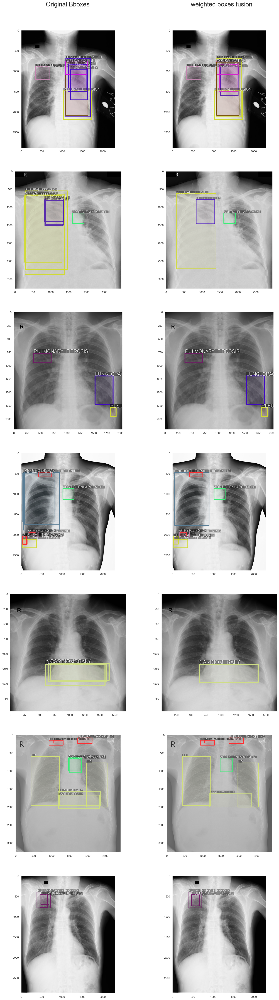

In [18]:
data_train = data.copy()
data_train['images'] = []
data_train['annotations'] = []
train_paths = 'Y:/vinBigData/train/'

label2color = [[59, 238, 119], [222, 21, 229], [94, 49, 164], [206, 221, 133], [117, 75, 3],
                 [210, 224, 119], [211, 176, 166], [63, 7, 197], [102, 65, 77], [194, 134, 175],
                 [209, 219, 50], [255, 44, 47], [89, 125, 149], [110, 27, 100]]
iou_thr = 0.5
skip_box_thr = 0.0001
viz_images = []
i = 0
for index, id in tqdm(enumerate(train_ids)):
    image_id = id
    hw = train_hw[train_hw.image_id==image_id]
    dim_h = hw.iloc[0]['dim0']
    dim_w = hw.iloc[0]['dim1']
    #print(image_id)
    #print(hw)
    #print(dim_h)
    #print(dim_w)
    #  = cv2.imread(path)
    #image_basename = Path(path).stem
#     print(f"(\'{image_basename}\', \'{path}\')")
    
    ## Copy Image 
    #shutil.copy2(path, train_output_dir)
    
    ## Add Images to annotation
    data_train['images'].append(dict(
        license=0,
        url=None,
        file_name=image_id+'.jpeg',
        height=dim_h,
        width=dim_w,
        date_captured=None,
        id=i
    ))
    img_annotations = train_annotations[train_annotations.image_id==image_id]
    boxes_viz = img_annotations[['x_min', 'y_min', 'x_max', 'y_max']].to_numpy().tolist()
    labels_viz = img_annotations['class_id'].to_numpy().tolist()
    #print(labels_viz)
    ## Visualize Original Bboxes every 500th
    if (i%500==0):
        img_array = cv2.imread(train_paths + image_id+'.jpeg')
        img_before = img_array
        for box, label in zip(boxes_viz, labels_viz):
            x_min, y_min, x_max, y_max = (box[0], box[1], box[2], box[3])
            color = label2color[int(label)]
            print(list(np.int_(box)))
            print(label)
            print(viz_labels[label])
            img_before = draw_bbox(img_before, list(np.int_(box)), viz_labels[label], color)
        viz_images.append(img_before)
    
    
    
    boxes_list = []
    scores_list = []
    labels_list = []
    weights = []
    
    boxes_single = []
    labels_single = []

    cls_ids = img_annotations['class_id'].unique().tolist()
    
    count_dict = Counter(img_annotations['class_id'].tolist())

    for cid in cls_ids:
        ## Performing Fusing operation only for multiple bboxes with the same label
        if count_dict[cid]==1:
            labels_single.append(cid)
            boxes_single.append(img_annotations[img_annotations.class_id==cid][['x_min', 'y_min', 'x_max', 'y_max']].to_numpy().squeeze().tolist())

        else:
            cls_list =img_annotations[img_annotations.class_id==cid]['class_id'].tolist()
            labels_list.append(cls_list)
            bbox = img_annotations[img_annotations.class_id==cid][['x_min', 'y_min', 'x_max', 'y_max']].to_numpy()
            
            ## Normalizing Bbox by Image Width and Height
            bbox = bbox/(dim_w, dim_h, dim_w, dim_h)
            #bbox = bbox/(dim_h, dim_w, dim_h, dim_w)
            bbox = np.clip(bbox, 0, 1)
            boxes_list.append(bbox.tolist())
            scores_list.append(np.ones(len(cls_list)).tolist())
            weights.append(1)
    
    ## Perform WBF
    
    boxes, scores, box_labels = weighted_boxes_fusion(boxes_list=boxes_list, scores_list=scores_list,
                                                  labels_list=labels_list, weights=weights,
                                                  iou_thr=iou_thr, skip_box_thr=skip_box_thr)
    
    boxes = boxes*(dim_w, dim_h, dim_w, dim_h)
    boxes = boxes.round(1).tolist()
    box_labels = box_labels.astype(int).tolist()
    boxes.extend(boxes_single)
    box_labels.extend(labels_single)
    
    #img_after = img_array.copy()
    for box, label in zip(boxes, box_labels):
        x_min, y_min, x_max, y_max = (box[0], box[1], box[2], box[3])
        area = round((x_max-x_min)*(y_max-y_min),1)
        bbox =[
                round(x_min, 1),
                round(y_min, 1),
                round((x_max-x_min), 1),
                round((y_max-y_min), 1)
                ]
        
        data_train['annotations'].append(dict( id=len(data_train['annotations']), image_id=i,
                                            category_id=int(label), area=area, bbox=bbox,
                                            iscrowd=0))


    ## Visualize Bboxes after operation every 500th
    if (i%500==0):
        img_array = cv2.imread(train_paths + image_id+'.jpeg')
        img_after = img_array.copy()
        for box, label in zip(boxes, box_labels):
            color = label2color[int(label)]
            img_after = draw_bbox(img_after, list(np.int_(box)), viz_labels[label], color)
        viz_images.append(img_after)

    i += 1

plot_imgs(viz_images, cmap=None)
plt.figtext(0.3, 0.9,"Original Bboxes", va="top", ha="center", size=25)
plt.figtext(0.73, 0.9,"weighted boxes fusion", va="top", ha="center", size=25)
plt.show()
               
#with open(train_out_file, 'w') as f:
#    json.dump(data_train, f, indent=4)
     


In [19]:
print("Number of Images in the Test Annotations File:", len(data_train['images']))
print("Number of Bboxes in the Test Annotations File:", len(data_train['annotations']))

Number of Images in the Test Annotations File: 3075
Number of Bboxes in the Test Annotations File: 16627


In [20]:
from collections import Counter

# Assume coco_data is loaded JSON data
annotations = data_train['annotations']
categories = data_train['categories']

# Count the occurrences of each category_id
category_counts = Counter([ann['category_id'] for ann in annotations])

# Map category_id to category name
category_id_to_name = {cat['id']: cat['name'] for cat in categories}

# Map counts to category names
category_name_counts = {category_id_to_name[cat_id]: count 
                        for cat_id, count in category_counts.items()}

category_name_counts

{'Lung_Opacity': 1388,
 'Atelectasis': 154,
 'Pleural_effusion': 1255,
 'Consolidation': 293,
 'Pulmonary_fibrosis': 2345,
 'Other_lesion': 1255,
 'Cardiomegaly': 1687,
 'Aortic_enlargement': 2358,
 'Infiltration': 654,
 'Pleural_thickening': 2831,
 'Nodule/Mass': 1289,
 'Calcification': 532,
 'ILD': 496,
 'Pneumothorax': 90}

In [21]:
data_train

{'info': {'description': 'barlowtwins-cxr',
  'url': None,
  'version': None,
  'year': 2023,
  'contributor': None,
  'date_created': '2023-12-05 22:32:06.047274'},
 'licenses': [{'url': None, 'id': 0, 'name': None}],
 'images': [{'license': 0,
   'url': None,
   'file_name': '20e27597c972c6e7fdb4d1e7638e227e.jpeg',
   'height': 2880,
   'width': 2304,
   'date_captured': None,
   'id': 0},
  {'license': 0,
   'url': None,
   'file_name': '03431b577d1ccf075e930c4c4913c079.jpeg',
   'height': 2952,
   'width': 2560,
   'date_captured': None,
   'id': 1},
  {'license': 0,
   'url': None,
   'file_name': 'fd810298e165ef0b9a88bb25fda7a34b.jpeg',
   'height': 3149,
   'width': 3165,
   'date_captured': None,
   'id': 2},
  {'license': 0,
   'url': None,
   'file_name': 'bd9a6c424edb2e622c1f4b6a59a58e91.jpeg',
   'height': 2472,
   'width': 2024,
   'date_captured': None,
   'id': 3},
  {'license': 0,
   'url': None,
   'file_name': 'a7ae31b4052444b8f576b657b1753445.jpeg',
   'height': 2688

In [22]:
# For example, use a custom function to convert the int64 type in the DataFrame
def convert_int64(obj):
    if isinstance(obj, np.int64):
        return int(obj)
    raise TypeError

# Use this function to convert the int64 type when serializing to JSON

train_out_file = 'train_annotations_1205.json'
with open(train_out_file, 'w') as f:
    json.dump(data_train, f, indent=4, default=convert_int64)

0it [00:00, ?it/s]

[973, 1361, 1726, 1586]
3
Cardiomegaly
[1177, 553, 1404, 790]
0
Aortic_enlargement
[1213, 281, 1418, 371]
11
Pleural_thickening
[967, 1285, 1736, 1592]
3
Cardiomegaly
[1221, 542, 1389, 781]
0
Aortic_enlargement
[1136, 529, 1397, 756]
0
Aortic_enlargement
[1552, 1828, 2207, 2592]
9
Other_lesion
[1676, 1797, 2416, 2577]
9
Other_lesion
[2267, 2458, 2475, 2647]
10
Pleural_effusion
[635, 1416, 756, 1525]
8
Nodule/Mass
[1769, 1966, 2375, 2547]
7
Lung_Opacity
[642, 1409, 760, 1525]
8
Nodule/Mass
[1676, 1797, 2416, 2577]
7
Lung_Opacity
[2267, 2458, 2475, 2647]
11
Pleural_thickening


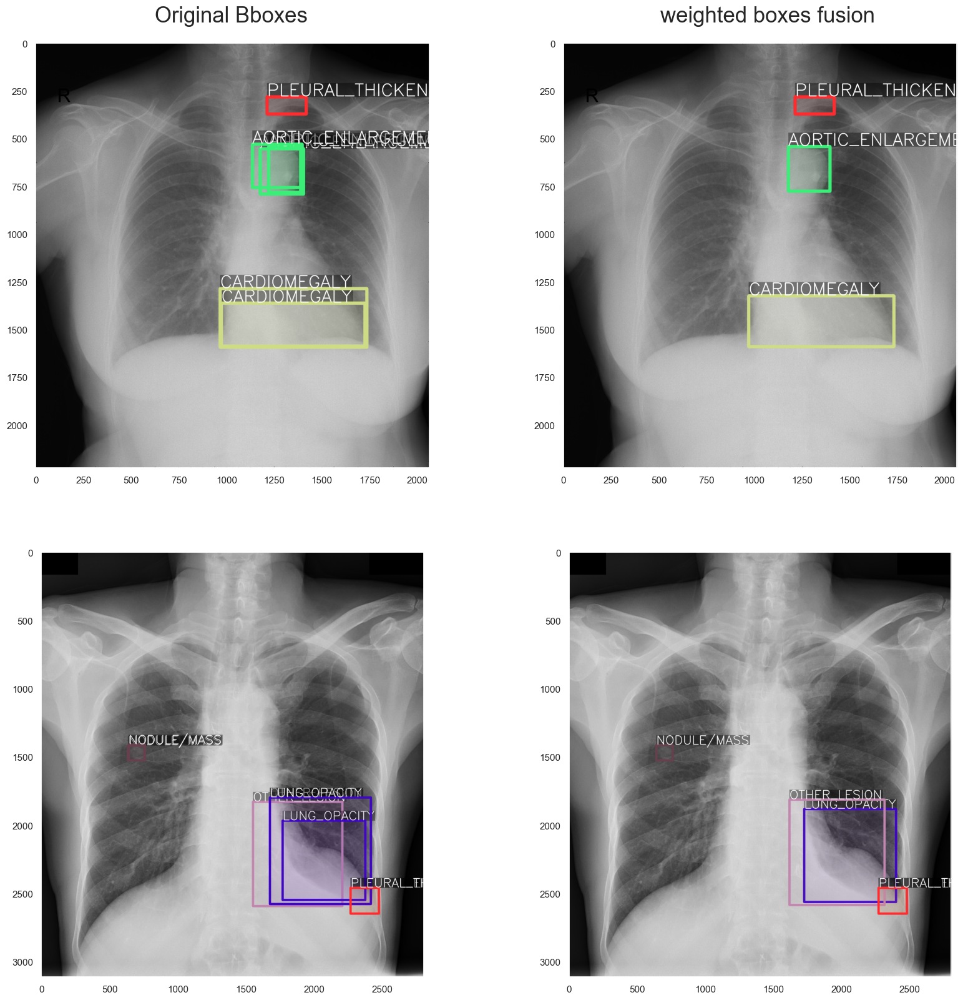

In [23]:
data_train = data.copy()
data_train['images'] = []
data_train['annotations'] = []
train_paths = 'Y:/vinBigData/train/'

iou_thr = 0.5
skip_box_thr = 0.0001
viz_images = []
i = 0
for index, id in tqdm(enumerate(val_ids)):
    image_id = id
    hw = train_hw[train_hw.image_id==image_id]
    dim_h = hw.iloc[0]['dim0']
    dim_w = hw.iloc[0]['dim1']
    #print(image_id)
    #print(hw)
    #print(dim_h)
    #print(dim_w)
    #  = cv2.imread(path)
    #image_basename = Path(path).stem
#     print(f"(\'{image_basename}\', \'{path}\')")
    
    ## Copy Image 
    #shutil.copy2(path, train_output_dir)
    
    ## Add Images to annotation
    data_train['images'].append(dict(
        license=0,
        url=None,
        file_name=image_id+'.jpeg',
        height=dim_h,
        width=dim_w,
        date_captured=None,
        id=i
    ))
    img_annotations = train_annotations[train_annotations.image_id==image_id]
    boxes_viz = img_annotations[['x_min', 'y_min', 'x_max', 'y_max']].to_numpy().tolist()
    labels_viz = img_annotations['class_id'].to_numpy().tolist()
    #print(labels_viz)
    ## Visualize Original Bboxes every 500th
    if (i%500==0):
        img_array = cv2.imread(train_paths + image_id+'.jpeg')
        img_before = img_array
        for box, label in zip(boxes_viz, labels_viz):
            x_min, y_min, x_max, y_max = (box[0], box[1], box[2], box[3])
            color = label2color[int(label)]
            print(list(np.int_(box)))
            print(label)
            print(viz_labels[label])
            img_before = draw_bbox(img_before, list(np.int_(box)), viz_labels[label], color)
        viz_images.append(img_before)
    
    
    
    boxes_list = []
    scores_list = []
    labels_list = []
    weights = []
    
    boxes_single = []
    labels_single = []

    cls_ids = img_annotations['class_id'].unique().tolist()
    
    count_dict = Counter(img_annotations['class_id'].tolist())

    for cid in cls_ids:
        ## Performing Fusing operation only for multiple bboxes with the same label
        if count_dict[cid]==1:
            labels_single.append(cid)
            boxes_single.append(img_annotations[img_annotations.class_id==cid][['x_min', 'y_min', 'x_max', 'y_max']].to_numpy().squeeze().tolist())

        else:
            cls_list =img_annotations[img_annotations.class_id==cid]['class_id'].tolist()
            labels_list.append(cls_list)
            bbox = img_annotations[img_annotations.class_id==cid][['x_min', 'y_min', 'x_max', 'y_max']].to_numpy()
            
            ## Normalizing Bbox by Image Width and Height
            bbox = bbox/(dim_w, dim_h, dim_w, dim_h)
            #bbox = bbox/(dim_h, dim_w, dim_h, dim_w)
            bbox = np.clip(bbox, 0, 1)
            boxes_list.append(bbox.tolist())
            scores_list.append(np.ones(len(cls_list)).tolist())
            weights.append(1)
    
    ## Perform WBF
    
    boxes, scores, box_labels = weighted_boxes_fusion(boxes_list=boxes_list, scores_list=scores_list,
                                                  labels_list=labels_list, weights=weights,
                                                  iou_thr=iou_thr, skip_box_thr=skip_box_thr)
    
    boxes = boxes*(dim_w, dim_h, dim_w, dim_h)
    boxes = boxes.round(1).tolist()
    box_labels = box_labels.astype(int).tolist()
    boxes.extend(boxes_single)
    box_labels.extend(labels_single)
    
    #img_after = img_array.copy()
    for box, label in zip(boxes, box_labels):
        x_min, y_min, x_max, y_max = (box[0], box[1], box[2], box[3])
        area = round((x_max-x_min)*(y_max-y_min),1)
        bbox =[
                round(x_min, 1),
                round(y_min, 1),
                round((x_max-x_min), 1),
                round((y_max-y_min), 1)
                ]
        
        data_train['annotations'].append(dict( id=len(data_train['annotations']), image_id=i,
                                            category_id=int(label), area=area, bbox=bbox,
                                            iscrowd=0))


    ## Visualize Bboxes after operation every 500th
    if (i%500==0):
        img_array = cv2.imread(train_paths + image_id+'.jpeg')
        img_after = img_array.copy()
        for box, label in zip(boxes, box_labels):
            color = label2color[int(label)]
            img_after = draw_bbox(img_after, list(np.int_(box)), viz_labels[label], color)
        viz_images.append(img_after)

    i += 1

plot_imgs(viz_images, cmap=None)
plt.figtext(0.3, 0.9,"Original Bboxes", va="top", ha="center", size=25)
plt.figtext(0.73, 0.9,"weighted boxes fusion", va="top", ha="center", size=25)
plt.show()
               
#with open(train_out_file, 'w') as f:
#    json.dump(data_train, f, indent=4)
     

In [24]:
print("Number of Images in the Test Annotations File:", len(data_train['images']))
print("Number of Bboxes in the Test Annotations File:", len(data_train['annotations']))

Number of Images in the Test Annotations File: 659
Number of Bboxes in the Test Annotations File: 3627


In [25]:
from collections import Counter

# Assume coco_data is loaded JSON data
annotations = data_train['annotations']
categories = data_train['categories']

# Count the occurrences of each category_id
category_counts = Counter([ann['category_id'] for ann in annotations])

# Map category_id to category name
category_id_to_name = {cat['id']: cat['name'] for cat in categories}

# Map counts to category names
category_name_counts = {category_id_to_name[cat_id]: count 
                        for cat_id, count in category_counts.items()}

category_name_counts

{'Aortic_enlargement': 498,
 'Cardiomegaly': 363,
 'Pleural_thickening': 607,
 'Other_lesion': 279,
 'Calcification': 108,
 'Pulmonary_fibrosis': 497,
 'Infiltration': 159,
 'Lung_Opacity': 310,
 'ILD': 128,
 'Pleural_effusion': 256,
 'Consolidation': 66,
 'Nodule/Mass': 305,
 'Pneumothorax': 16,
 'Atelectasis': 35}

In [26]:
# For example, use a custom function to convert the int64 type in the DataFrame
def convert_int64(obj):
    if isinstance(obj, np.int64):
        return int(obj)
    raise TypeError

# Use this function to convert the int64 type when serializing to JSON

train_out_file = 'valid_annotations_1205.json'
with open(train_out_file, 'w') as f:
    json.dump(data_train, f, indent=4, default=convert_int64)

0it [00:00, ?it/s]

[559, 1853, 679, 2022]
10
Pleural_effusion
[559, 1853, 679, 2022]
11
Pleural_thickening
[1281, 713, 1593, 1151]
0
Aortic_enlargement
[1959, 1609, 2062, 1728]
8
Nodule/Mass
[740, 1697, 850, 1787]
8
Nodule/Mass
[1095, 718, 1592, 1088]
0
Aortic_enlargement
[1316, 701, 1568, 1020]
0
Aortic_enlargement
[538, 1824, 669, 2064]
10
Pleural_effusion
[540, 1810, 755, 2091]
10
Pleural_effusion
[540, 1810, 755, 2091]
11
Pleural_thickening
[538, 1824, 669, 2064]
11
Pleural_thickening
[1164, 569, 1547, 1600]
9
Other_lesion
[1110, 561, 1501, 2051]
9
Other_lesion
[587, 626, 894, 904]
11
Pleural_thickening
[1753, 517, 2136, 783]
11
Pleural_thickening
[1599, 552, 1957, 615]
11
Pleural_thickening
[766, 1791, 979, 1881]
13
Pulmonary_fibrosis
[979, 1816, 2139, 2200]
3
Cardiomegaly
[1496, 916, 1759, 1302]
0
Aortic_enlargement
[883, 625, 1130, 661]
11
Pleural_thickening
[1391, 915, 1771, 1329]
0
Aortic_enlargement
[1014, 1804, 2133, 2199]
3
Cardiomegaly
[1000, 1834, 2138, 2208]
3
Cardiomegaly
[1468, 898, 1775

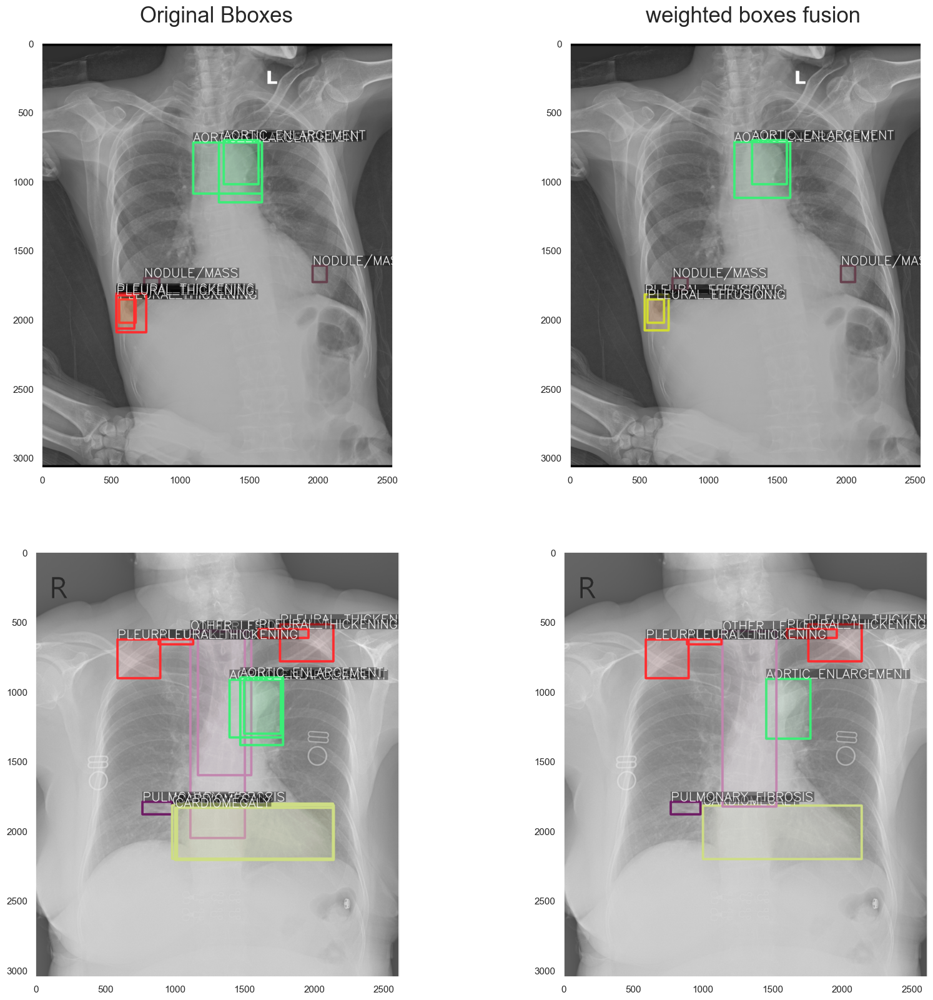

In [27]:
data_train = data.copy()
data_train['images'] = []
data_train['annotations'] = []
train_paths = 'Y:/vinBigData/train/'

iou_thr = 0.5
skip_box_thr = 0.0001
viz_images = []
i = 0
for index, id in tqdm(enumerate(test_ids)):
    image_id = id
    hw = train_hw[train_hw.image_id==image_id]
    dim_h = hw.iloc[0]['dim0']
    dim_w = hw.iloc[0]['dim1']
    #print(image_id)
    #print(hw)
    #print(dim_h)
    #print(dim_w)
    #  = cv2.imread(path)
    #image_basename = Path(path).stem
#     print(f"(\'{image_basename}\', \'{path}\')")
    
    ## Copy Image 
    #shutil.copy2(path, train_output_dir)
    
    ## Add Images to annotation
    data_train['images'].append(dict(
        license=0,
        url=None,
        file_name=image_id+'.jpeg',
        height=dim_h,
        width=dim_w,
        date_captured=None,
        id=i
    ))
    img_annotations = train_annotations[train_annotations.image_id==image_id]
    boxes_viz = img_annotations[['x_min', 'y_min', 'x_max', 'y_max']].to_numpy().tolist()
    labels_viz = img_annotations['class_id'].to_numpy().tolist()
    #print(labels_viz)
    ## Visualize Original Bboxes every 500th
    if (i%500==0):
        img_array = cv2.imread(train_paths + image_id+'.jpeg')
        img_before = img_array
        for box, label in zip(boxes_viz, labels_viz):
            x_min, y_min, x_max, y_max = (box[0], box[1], box[2], box[3])
            color = label2color[int(label)]
            print(list(np.int_(box)))
            print(label)
            print(viz_labels[label])
            img_before = draw_bbox(img_before, list(np.int_(box)), viz_labels[label], color)
        viz_images.append(img_before)
    
    
    
    boxes_list = []
    scores_list = []
    labels_list = []
    weights = []
    
    boxes_single = []
    labels_single = []

    cls_ids = img_annotations['class_id'].unique().tolist()
    
    count_dict = Counter(img_annotations['class_id'].tolist())

    for cid in cls_ids:
        ## Performing Fusing operation only for multiple bboxes with the same label
        if count_dict[cid]==1:
            labels_single.append(cid)
            boxes_single.append(img_annotations[img_annotations.class_id==cid][['x_min', 'y_min', 'x_max', 'y_max']].to_numpy().squeeze().tolist())

        else:
            cls_list =img_annotations[img_annotations.class_id==cid]['class_id'].tolist()
            labels_list.append(cls_list)
            bbox = img_annotations[img_annotations.class_id==cid][['x_min', 'y_min', 'x_max', 'y_max']].to_numpy()
            
            ## Normalizing Bbox by Image Width and Height
            bbox = bbox/(dim_w, dim_h, dim_w, dim_h)
            #bbox = bbox/(dim_h, dim_w, dim_h, dim_w)
            bbox = np.clip(bbox, 0, 1)
            boxes_list.append(bbox.tolist())
            scores_list.append(np.ones(len(cls_list)).tolist())
            weights.append(1)
    
    ## Perform WBF
    
    boxes, scores, box_labels = weighted_boxes_fusion(boxes_list=boxes_list, scores_list=scores_list,
                                                  labels_list=labels_list, weights=weights,
                                                  iou_thr=iou_thr, skip_box_thr=skip_box_thr)
    
    boxes = boxes*(dim_w, dim_h, dim_w, dim_h)
    boxes = boxes.round(1).tolist()
    box_labels = box_labels.astype(int).tolist()
    boxes.extend(boxes_single)
    box_labels.extend(labels_single)
    
    #img_after = img_array.copy()
    for box, label in zip(boxes, box_labels):
        x_min, y_min, x_max, y_max = (box[0], box[1], box[2], box[3])
        area = round((x_max-x_min)*(y_max-y_min),1)
        bbox =[
                round(x_min, 1),
                round(y_min, 1),
                round((x_max-x_min), 1),
                round((y_max-y_min), 1)
                ]
        
        data_train['annotations'].append(dict( id=len(data_train['annotations']), image_id=i,
                                            category_id=int(label), area=area, bbox=bbox,
                                            iscrowd=0))


    ## Visualize Bboxes after operation every 500th
    if (i%500==0):
        img_array = cv2.imread(train_paths + image_id+'.jpeg')
        img_after = img_array.copy()
        for box, label in zip(boxes, box_labels):
            color = label2color[int(label)]
            img_after = draw_bbox(img_after, list(np.int_(box)), viz_labels[label], color)
        viz_images.append(img_after)

    i += 1

plot_imgs(viz_images, cmap=None)
plt.figtext(0.3, 0.9,"Original Bboxes", va="top", ha="center", size=25)
plt.figtext(0.73, 0.9,"weighted boxes fusion", va="top", ha="center", size=25)
plt.show()
               
#with open(train_out_file, 'w') as f:
#    json.dump(data_train, f, indent=4)

In [30]:
print("Number of Images in the Test Annotations File:", len(data_train['images']))
print("Number of Bboxes in the Test Annotations File:", len(data_train['annotations']))

Number of Images in the Test Annotations File: 660
Number of Bboxes in the Test Annotations File: 3680


In [28]:
from collections import Counter

# Assume coco_data is loaded JSON data
annotations = data_train['annotations']
categories = data_train['categories']

# Count the occurrences of each category_id
category_counts = Counter([ann['category_id'] for ann in annotations])

# Map category_id to category
category_id_to_name = {cat['id']: cat['name'] for cat in categories}

# Map counts to category names
category_name_counts = {category_id_to_name[cat_id]: count 
                        for cat_id, count in category_counts.items()}

category_name_counts

{'Aortic_enlargement': 530,
 'Pleural_thickening': 620,
 'Pleural_effusion': 260,
 'Nodule/Mass': 273,
 'Cardiomegaly': 352,
 'Lung_Opacity': 319,
 'Other_lesion': 302,
 'Pulmonary_fibrosis': 527,
 'ILD': 109,
 'Calcification': 105,
 'Consolidation': 76,
 'Atelectasis': 41,
 'Pneumothorax': 25,
 'Infiltration': 141}

In [29]:
# For example, use a custom function to convert the int64 type in the DataFrame
def convert_int64(obj):
    if isinstance(obj, np.int64):
        return int(obj)
    raise TypeError

# Use this function to convert the int64 type when serializing to JSON

train_out_file = 'test_annotations_1205.json'
with open(train_out_file, 'w') as f:
    json.dump(data_train, f, indent=4, default=convert_int64)